# Pairwise contact-map comparisons

Side-by-side contact maps + a log2-ratio difference panel for any pair of conditions present in `results/analysis/` — and any pair against the **experimental Bonev 2017 Hi-C** references in `data/mcool/`.

**How to use:** edit `CONDITIONS`, `MCOOL_REFS`, `PAIRS`, and the universal tuning knobs (`Save_plots`, `FIGURES_DIR`, `HIC_VMIN_PCT` / `HIC_VMAX_PCT` / `HIC_VMIN` / `HIC_VMAX`, `SIM_DUAL_SCALE`, `SIM_VS_HIC_SCALE`) in **cell 1**. Every plotting / metrics / convergence cell reads them from the kernel namespace, so changing one knob in cell 1 + re-running cell 1 + the affected plot cell propagates everywhere.

**Inputs:**
- Sim contact maps: prefer the pooled-across-replicates file (`{condition}_*blk_pooled_contact_map.npy`) under `results/analysis/`, fall back to averaging per-replicate maps (`{condition}_*blk_rep*_contact_map.npy`).
- Hi-C references: `data/mcool/ES_chr3.mcool` (mESC) and `data/mcool/CN_chr3.mcool` (cortical neuron), balance-normalised, fetched at the same resolution and over the same chr3 region as the sims via `cooler`.

**Outputs:** PNG + SVG figures under `notebooks/output/` (the `FIGURES_DIR` set in cell 1), plus per-pair metrics and convergence verdicts printed inline. Set `Save_plots = False` in cell 1 to render figures inline only without writing to disk.

**Key sanity comparisons** wired into the default `PAIRS`:
- `mESC_ctcf-mESC` vs `Hi-C_mESC` — does the mESC sim recover the experimental mESC pattern?
- `CN_baseline_ctcf-neuron` vs `Hi-C_neuron` — does keeping mESC cohesin while swapping CTCF fail to match neuron Hi-C? (it should, that's the null)
- `CN_very_long_residency_ctcf-neuron` vs `Hi-C_neuron` — does the longer-residency cohesin variant get closer to neuron Hi-C?
- `Hi-C_mESC` vs `Hi-C_neuron` — the actual experimental difference you're trying to recapitulate.

In [124]:
from pathlib import Path
import glob
import re
from itertools import combinations
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# --- Resolve project root ---
REPO_ROOT = Path.cwd()
if REPO_ROOT.name == "notebooks":
    REPO_ROOT = REPO_ROOT.parent

ANALYSIS_DIR = REPO_ROOT / "results" / "analysis"
DATA_DIR     = REPO_ROOT / "data"

# ============================================================================
# EDIT BELOW
# ============================================================================
# --- Output / saving controls ----------------------------------------------
# Single switch read by every plotting cell below: when False the figures
# still display inline but no PNG/SVG is written to disk.
Save_plots = True

# Where saved figures land.  Resolved relative to the notebook's working
# directory, so for `cohesin_sim/notebooks/` this is
# `cohesin_sim/notebooks/output/`.  Override with an absolute path here
# if you want figures elsewhere.
FIGURES_DIR = Path("output").resolve()
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
# ---------------------------------------------------------------------------

# --- Color-scale knobs (universal across the notebook) --------------------
# Every contact-map cell below reads these from the kernel namespace, so
# you tune contrast in ONE place: edit a value here, re-run cell 1, then
# re-run the affected plot cell.

# Cell 12 — Hi-C ES vs CN dual triangle.  The cell prints the auto-
# derived defaults next to the values actually used so you can see at a
# glance whether your override took effect.
HIC_VMIN_PCT = 50.0   # percentile bound used when HIC_VMIN is None
HIC_VMAX_PCT = 99.0   # percentile bound used when HIC_VMAX is None
HIC_VMIN     = None   # set to a number (e.g. 1e-3) to override vmin_pct
HIC_VMAX     = None   # set to a number (e.g. 5e-2) to override vmax_pct

# Cell 14 — mESC sim vs CN sim dual triangle (MSD overlay).
SIM_DUAL_SCALE = dict(
    vmin_pct=20.0,    # plot_hic_dual default; raise to saturate low end
    vmax_pct=99.5,    # plot_hic_dual default; lower to saturate hot end
    vmin=None,        # absolute override (sim contacts ~ 1e-3..1e-1)
    vmax=None,
)

# ---------------------------------------------------------------------------

# Simulated conditions to load. On-disk stems exactly as they appear in
# results/analysis/ filenames (see README §"Directory naming convention").
CONDITIONS = [
    "mESC_ctcf-mESC",                      # baseline pluripotent control
    "mESC_ctcf-neuron",                    # CTCF-only counterfactual
    "CN_baseline_ctcf-neuron",             # null hypothesis (same cohesin as mESC)
    "CN_long_residency_ctcf-neuron",       # 2x cohesin residency
    "CN_very_long_residency_ctcf-neuron",  # 4x cohesin residency
]

# Reference Hi-C maps (Bonev 2017 mcool). Each is loaded at the same
# resolution and over the same region as the sim maps, balanced-normalised.
# Set to {} to skip; set INCLUDE_HIC_REFS = False below for an env-level kill switch.
# Each entry's "ctcf_source" picks the BED used for the arrow overlay
# on that reference panel (since Hi-C names lack the _ctcf-<src> token).
MCOOL_REFS = {
    "Hi-C_mESC":   {"path": DATA_DIR / "mcool" / "ES_chr3.mcool",
                    "ctcf_source": "mESC"},
    "Hi-C_neuron": {"path": DATA_DIR / "mcool" / "CN_chr3.mcool",
                    "ctcf_source": "neuron"},
}
INCLUDE_HIC_REFS = True

# Pairs to compare. Sim-vs-sim AND sim-vs-Hi-C are both supported because
# the loader unifies everything into one `maps` dict.
#   PAIRS = list(combinations(CONDITIONS, 2))            # all sim pairs
#   PAIRS = [(c, "Hi-C_mESC") for c in CONDITIONS]       # every sim vs mESC Hi-C
PAIRS = [
    ("mESC_ctcf-mESC",                "mESC_ctcf-neuron"),
    ("mESC_ctcf-neuron",              "CN_baseline_ctcf-neuron"),
    ("CN_baseline_ctcf-neuron",       "CN_long_residency_ctcf-neuron"),
    ("CN_baseline_ctcf-neuron",       "CN_very_long_residency_ctcf-neuron"),
    # Sanity comparisons against experimental Hi-C:
    ("mESC_ctcf-mESC",                "Hi-C_mESC"),
    ("CN_baseline_ctcf-neuron",       "Hi-C_neuron"),
    ("CN_very_long_residency_ctcf-neuron", "Hi-C_neuron"),
    ("Hi-C_mESC",                     "Hi-C_neuron"),
]

# CTCF site overlay (oriented BEDs). Keyed by the `<ctcf_source>` token
# in the condition name (i.e. the part after `_ctcf-`) for sims, and by
# the explicit `ctcf_source` field above for Hi-C references.
CTCF_BEDS = {
    "mESC":   DATA_DIR / "ctcf_oriented_mm10_mESC_Bruce4_chr3_34000000_36000000.bed",
    "neuron": DATA_DIR / "ctcf_oriented_mm10_GSE96107_CN_chr3_34000000_36000000.bed",
}

# Genomic region the contact maps cover. Must match configs/parameters.py.
CHROM           = "chr3"
REGION_START_BP = 34_000_000
REGION_END_BP   = 36_000_000
RESOLUTION_BP   = 1_000   # 1 kb bins -> 2000 x 2000 matrix

SHOW_CTCF = True          # set False to skip CTCF arrow overlays globally
# ============================================================================

# Sanity: every condition referenced in PAIRS must also be loadable.
_known = set(CONDITIONS) | (set(MCOOL_REFS) if INCLUDE_HIC_REFS else set())
_extra = {c for pair in PAIRS for c in pair} - _known
assert not _extra, (
    f"PAIRS uses conditions not in CONDITIONS or MCOOL_REFS: {_extra}"
)

print(f"Repo root    : {REPO_ROOT}")
print(f"Analysis dir : {ANALYSIS_DIR}")
print(f"Figures dir  : {FIGURES_DIR}   (Save_plots={Save_plots})")
print(f"Data dir     : {DATA_DIR}")
print(f"Sim conds    : {len(CONDITIONS)}")
print(f"Hi-C refs    : {len(MCOOL_REFS) if INCLUDE_HIC_REFS else 0}")
print(f"Pairs        : {len(PAIRS)}")
print(f"CTCF overlay : {SHOW_CTCF} ({list(CTCF_BEDS)})")

Repo root    : C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_in_neurons\cohesin_sim
Analysis dir : C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_in_neurons\cohesin_sim\results\analysis
Figures dir  : C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_in_neurons\cohesin_sim\notebooks\output   (Save_plots=True)
Data dir     : C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_in_neurons\cohesin_sim\data
Sim conds    : 5
Hi-C refs    : 2
Pairs        : 8
CTCF overlay : True (['mESC', 'neuron'])


## Load all maps (sim + Hi-C reference)

Reads every entry in `CONDITIONS` (sim contact maps from `results/analysis/`) and every entry in `MCOOL_REFS` (balanced Hi-C from `data/mcool/`). All maps end up in the same `maps` dict keyed by their stem, so plotting / metrics / convergence cells handle simulated and experimental panels uniformly.

In [125]:
def load_condition_map(analysis_dir: Path, condition: str) -> tuple[np.ndarray, str]:
    """Return (matrix, label). Prefers a pooled map; falls back to mean of reps."""
    pooled = sorted(glob.glob(
        str(analysis_dir / f"{condition}_*blk_pooled_contact_map.npy")
    ))
    if pooled:
        m = np.load(pooled[-1])  # latest by block count if multiple
        return m, f"{condition} (pooled, {Path(pooled[-1]).name})"

    rep_paths = sorted(glob.glob(
        str(analysis_dir / f"{condition}_*blk_rep*_contact_map.npy")
    ))
    if not rep_paths:
        raise FileNotFoundError(
            f"No contact maps found for '{condition}' in {analysis_dir}. "
            f"Expected '{condition}_*blk_pooled_contact_map.npy' or "
            f"'{condition}_*blk_rep*_contact_map.npy'."
        )
    mats = [np.load(p) for p in rep_paths]
    m = np.mean(mats, axis=0)
    return m, f"{condition} (mean of {len(mats)} reps)"


def load_mcool_region(mcool_path: Path, chrom: str,
                      start_bp: int, end_bp: int,
                      resolution_bp: int) -> tuple[np.ndarray, str]:
    """Fetch a balanced contact-frequency matrix from an mcool over [start, end).

    Uses cooler::resolutions/<bp> URI path so any resolution stored in the
    .mcool can be selected (the ones we care about are 1 kb, matching
    RESOLUTION_BP / N_MONOMERS so the shape lines up with sim maps).
    """
    import cooler  # imported lazily so the rest of the notebook works
                    # even if cooler isn't installed
    uri = f"{mcool_path}::/resolutions/{resolution_bp}"
    clr = cooler.Cooler(uri)
    region = f"{chrom}:{start_bp}-{end_bp}"
    m = clr.matrix(balance=True).fetch(region)
    # Balanced matrices have NaN where bins are masked (low coverage,
    # blacklist, etc.); replace with 0 so downstream log-scale plotting
    # and Frobenius/Pearson math work without NaN propagation.
    m = np.where(np.isfinite(m), m, 0.0)
    return m, f"Bonev Hi-C ({mcool_path.name} @ {resolution_bp//1000} kb)"


def parse_oriented_ctcf_bed(bed_path: Path,
                            region_start_bp: int, region_end_bp: int,
                            resolution_bp: int) -> list[tuple[int, str]]:
    """Parse an oriented CTCF BED into [(bin_idx, strand), ...] within the region."""
    sites: list[tuple[int, str]] = []
    with open(bed_path) as f:
        for line in f:
            line = line.rstrip("\n")
            if not line or line.startswith("#") or line.startswith("track"):
                continue
            parts = line.split("\t")
            if len(parts) < 6:
                continue
            try:
                start = int(parts[1])
                end   = int(parts[2])
            except ValueError:
                continue
            strand = parts[5]
            if strand not in ("+", "-"):
                continue
            mid = (start + end) // 2
            if mid < region_start_bp or mid >= region_end_bp:
                continue
            bin_idx = (mid - region_start_bp) // resolution_bp
            sites.append((bin_idx, strand))
    return sites


_CTCF_SOURCE_RE = re.compile(r"_ctcf-(?P<src>[A-Za-z0-9]+)")

def ctcf_source_for_sim(condition: str) -> str | None:
    """Extract the CTCF source token from a sim condition name."""
    m = _CTCF_SOURCE_RE.search(condition)
    return m.group("src") if m else None


# Cache parsed BEDs so we don't re-read the same file once per condition.
_BED_CACHE: dict[str, list[tuple[int, str]]] = {}

def ctcf_sites_for_source(src: str | None) -> list[tuple[int, str]]:
    """Look up parsed CTCF sites by source token (e.g. 'mESC' / 'neuron')."""
    if not SHOW_CTCF or src is None:
        return []
    if src in _BED_CACHE:
        return _BED_CACHE[src]
    bed_path = CTCF_BEDS.get(src)
    if bed_path is None or not bed_path.exists():
        print(f"  no BED registered for ctcf_source={src!r}; skipping its overlay")
        _BED_CACHE[src] = []
        return _BED_CACHE[src]
    sites = parse_oriented_ctcf_bed(bed_path, REGION_START_BP, REGION_END_BP, RESOLUTION_BP)
    _BED_CACHE[src] = sites
    return sites


# ---------------------------------------------------------------------------
# Load everything into the same dicts.
maps: dict[str, np.ndarray]   = {}
labels: dict[str, str]        = {}
ctcf_sites: dict[str, list]   = {}
ctcf_src_for: dict[str, str | None] = {}   # used by the plot titles

# 1. Sim contact maps.
for cond in CONDITIONS:
    try:
        m, lab = load_condition_map(ANALYSIS_DIR, cond)
    except FileNotFoundError as e:
        print(f"  [skip] {cond}: {e}")
        continue
    src = ctcf_source_for_sim(cond)
    maps[cond]         = m
    labels[cond]       = lab
    ctcf_src_for[cond] = src
    ctcf_sites[cond]   = ctcf_sites_for_source(src)
    print(f"  {cond:40s} {lab}    shape={m.shape}    "
          f"CTCF[{src}]={len(ctcf_sites[cond])} sites")

# 2. Hi-C references.
if INCLUDE_HIC_REFS:
    for ref_name, info in MCOOL_REFS.items():
        path = Path(info["path"])
        if not path.exists():
            print(f"  [skip] {ref_name}: {path} not found")
            continue
        try:
            m, lab = load_mcool_region(path, CHROM, REGION_START_BP, REGION_END_BP, RESOLUTION_BP)
        except ImportError:
            print(f"  [skip] {ref_name}: cooler not installed in this env "
                  "(run `mamba install -c bioconda cooler` if you want Hi-C refs)")
            break
        except Exception as e:
            print(f"  [skip] {ref_name}: failed to load ({e})")
            continue
        src = info.get("ctcf_source")
        maps[ref_name]         = m
        labels[ref_name]       = lab
        ctcf_src_for[ref_name] = src
        ctcf_sites[ref_name]   = ctcf_sites_for_source(src)
        print(f"  {ref_name:40s} {lab}    shape={m.shape}    "
              f"CTCF[{src}]={len(ctcf_sites[ref_name])} sites")

# Sanity: all loaded matrices must have identical shape.
shapes = {cond: m.shape for cond, m in maps.items()}
unique_shapes = set(shapes.values())
assert len(unique_shapes) == 1, (
    f"shape mismatch across maps:\n  "
    + "\n  ".join(f"{k}: {v}" for k, v in shapes.items())
    + f"\nCheck RESOLUTION_BP and the region [{REGION_START_BP}, {REGION_END_BP}); "
      "the mcool must have a /resolutions/{RESOLUTION_BP} entry."
)
print(f"\nLoaded {len(maps)} maps total ({len(CONDITIONS)} sim + "
      f"{sum(1 for k in maps if k in MCOOL_REFS)} Hi-C ref), "
      f"shape = {next(iter(unique_shapes))}.")

  mESC_ctcf-mESC                           mESC_ctcf-mESC (pooled, mESC_ctcf-mESC_174200blk_pooled_contact_map.npy)    shape=(2000, 2000)    CTCF[mESC]=26 sites
  mESC_ctcf-neuron                         mESC_ctcf-neuron (pooled, mESC_ctcf-neuron_159400blk_pooled_contact_map.npy)    shape=(2000, 2000)    CTCF[neuron]=16 sites
  CN_baseline_ctcf-neuron                  CN_baseline_ctcf-neuron (pooled, CN_baseline_ctcf-neuron_235800blk_pooled_contact_map.npy)    shape=(2000, 2000)    CTCF[neuron]=16 sites
  CN_long_residency_ctcf-neuron            CN_long_residency_ctcf-neuron (pooled, CN_long_residency_ctcf-neuron_78500blk_pooled_contact_map.npy)    shape=(2000, 2000)    CTCF[neuron]=16 sites
  CN_very_long_residency_ctcf-neuron       CN_very_long_residency_ctcf-neuron (pooled, CN_very_long_residency_ctcf-neuron_50000blk_pooled_contact_map.npy)    shape=(2000, 2000)    CTCF[neuron]=16 sites
  Hi-C_mESC                                Bonev Hi-C (ES_chr3.mcool @ 1 kb)    shape=(2000, 2000

## Side-by-side heatmaps with a log-ratio difference panel

Generates one 3-panel PNG per pair in `PAIRS` (saving gated on `Save_plots`). Each panel: condition A | condition B | log2(B/A).

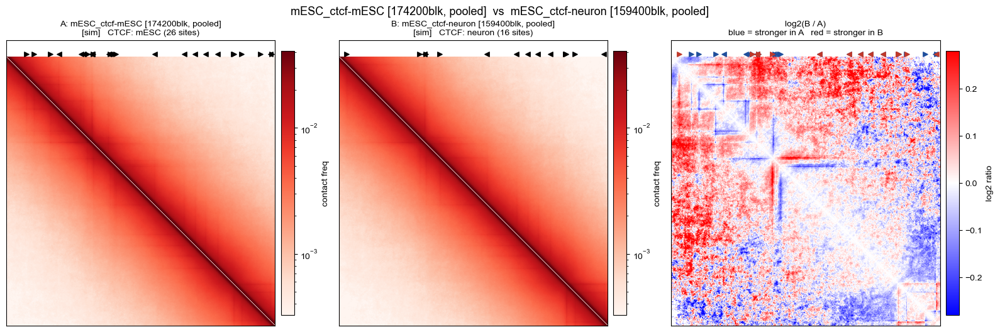

  saved: compare_mESC_ctcf-mESC_vs_mESC_ctcf-neuron.png


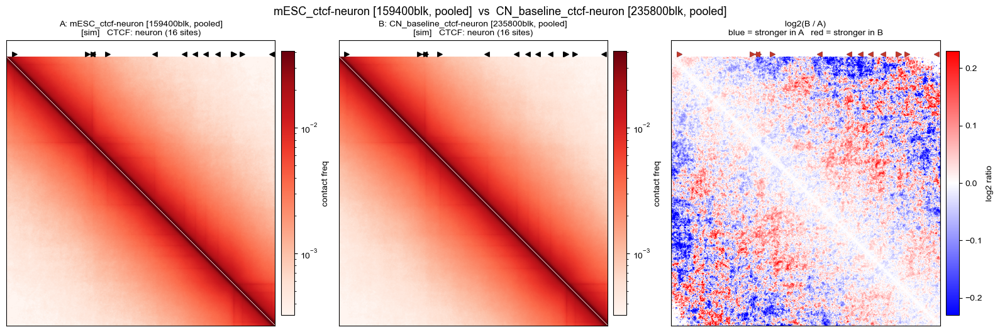

  saved: compare_mESC_ctcf-neuron_vs_CN_baseline_ctcf-neuron.png


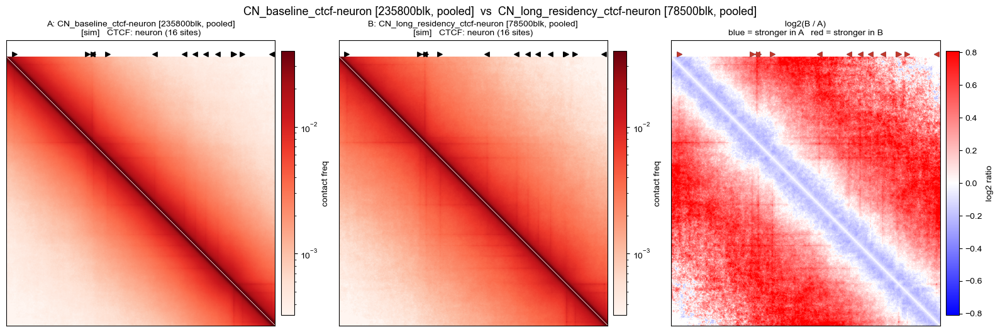

  saved: compare_CN_baseline_ctcf-neuron_vs_CN_long_residency_ctcf-neuron.png


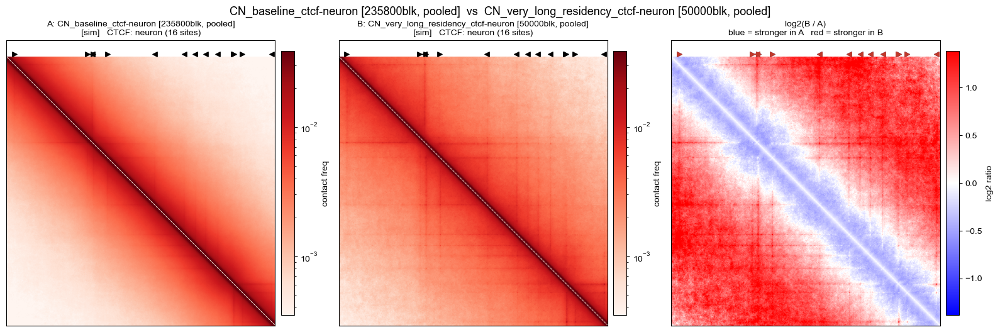

  saved: compare_CN_baseline_ctcf-neuron_vs_CN_very_long_residency_ctcf-neuron.png


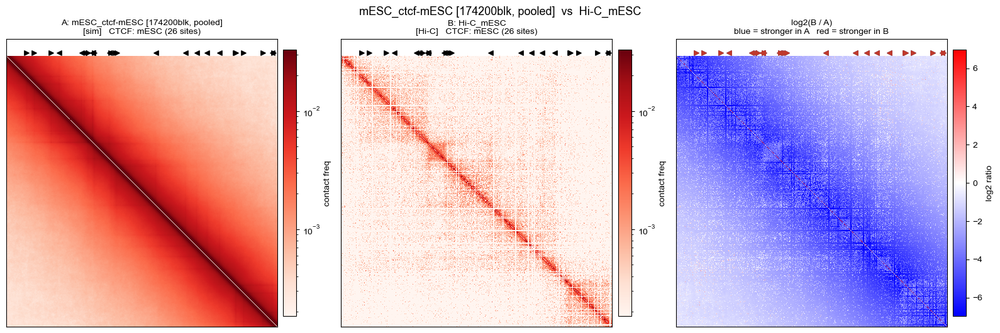

  saved: compare_mESC_ctcf-mESC_vs_Hi-C_mESC.png


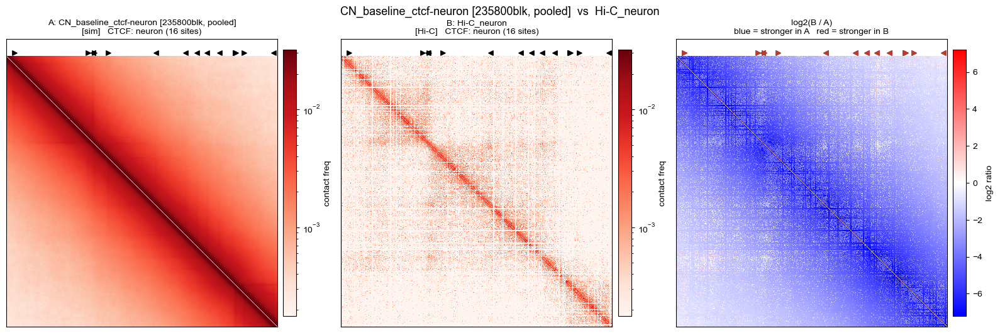

  saved: compare_CN_baseline_ctcf-neuron_vs_Hi-C_neuron.png


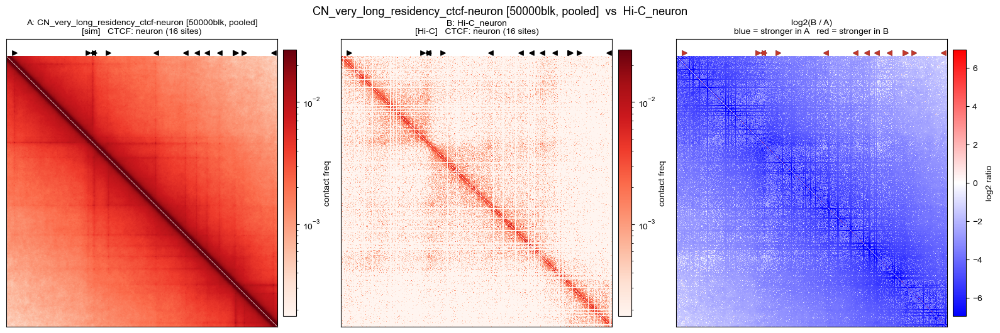

  saved: compare_CN_very_long_residency_ctcf-neuron_vs_Hi-C_neuron.png


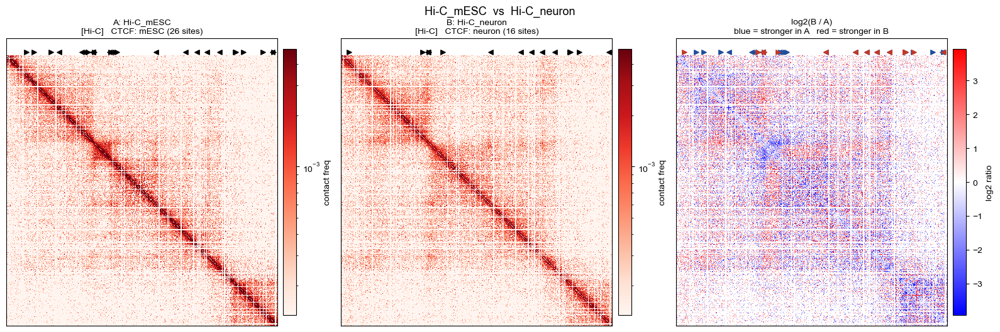

  saved: compare_Hi-C_mESC_vs_Hi-C_neuron.png


In [126]:
def shared_log_scale(*matrices, lo_pct=1.0, hi_pct=98.0):
    flat = np.concatenate([m[m > 0].ravel() for m in matrices if (m > 0).any()])
    return float(np.percentile(flat, lo_pct)), float(np.percentile(flat, hi_pct))


def overlay_ctcf_arrows(ax, sites: list[tuple[int, str]], n_bins: int,
                        marker_size: int = 28, color: str = "black") -> None:
    """Draw oriented CTCF triangles on the top edge of a heatmap.

    Forward (+) sites point right (>); reverse (-) sites point left (<).
    Triangles sit just above the matrix in axes coordinates.
    """
    if not sites:
        return
    fwd_x = [b for b, s in sites if s == "+"]
    rev_x = [b for b, s in sites if s == "-"]
    y = -n_bins * 0.012
    ax.scatter(fwd_x, [y] * len(fwd_x), marker=">", s=marker_size,
               c=color, clip_on=False, zorder=5)
    ax.scatter(rev_x, [y] * len(rev_x), marker="<", s=marker_size,
               c=color, clip_on=False, zorder=5)


def is_hic_reference(name: str) -> bool:
    return name in MCOOL_REFS


# ---------------------------------------------------------------------------
# Block / replicate provenance for figure titles.
# Per project rule: every label that names a SIMULATED map must include
# the block count and (when known) the replicate count.  Hi-C references
# are returned unchanged.
# ---------------------------------------------------------------------------
def _short_sim_label(name: str) -> str:
    """Compact provenance label for a simulated condition.

    Examples:
        sim, pooled:        'mESC_ctcf-mESC [174200blk, pooled]'
        sim, mean of reps:  'CN_long_residency_ctcf-neuron [78500blk, mean of 3 reps]'
        Hi-C reference:     'Hi-C_neuron'   (returned as-is)
    """
    if is_hic_reference(name):
        return name
    label = labels.get(name, "")
    m = re.search(r"_(\d+)blk_pooled_contact_map\.npy", label)
    if m:
        return f"{name} [{m.group(1)}blk, pooled]"
    m_reps = re.search(r"mean of (\d+) reps", label)
    if m_reps:
        # Also surface the blk count from any rep filename if present.
        rep_paths = sorted(glob.glob(
            str(ANALYSIS_DIR / f"{name}_*blk_rep*_contact_map.npy")
        ))
        if rep_paths:
            m_blk = re.search(r"_(\d+)blk_rep", Path(rep_paths[0]).name)
            if m_blk:
                return (f"{name} [{m_blk.group(1)}blk, "
                        f"mean of {m_reps.group(1)} reps]")
        return f"{name} [mean of {m_reps.group(1)} reps]"
    return name


def panel_title(name: str) -> str:
    """First-line title used in each subplot."""
    kind = "Hi-C" if is_hic_reference(name) else "sim"
    src  = ctcf_src_for.get(name)
    src_str = f"CTCF: {src}" if src else "CTCF: -"
    short = _short_sim_label(name)
    return (f"{short}\n[{kind}]   {src_str} "
            f"({len(ctcf_sites.get(name, []))} sites)")


def plot_pair(cond_a: str, cond_b: str, maps: dict, ctcf_sites: dict,
              figures_dir: Path, *, dpi: int = 200, show: bool = True) -> Path:
    """Render a 3-panel A | B | log2(B/A) PNG for one condition pair.

    A and B can be any combination of simulated conditions and Hi-C
    references — the loader unifies them in the same `maps` dict.
    """
    map_a = maps[cond_a]
    map_b = maps[cond_b]
    n_bins = map_a.shape[0]

    sites_a = ctcf_sites.get(cond_a, [])
    sites_b = ctcf_sites.get(cond_b, [])

    # Shared log-scale across the two panels so they're visually comparable.
    # Note: balanced Hi-C and sim contact frequencies are on different
    # absolute scales. The percentile clipping makes the relative-pattern
    # comparison the dominant visual cue (loops/TADs appear at similar
    # contrast in both panels even if numbers differ by orders of magnitude).
    vmin, vmax = shared_log_scale(map_a, map_b)
    fl = max(vmin, 1e-12)
    log2_ratio = np.log2(np.maximum(map_b, fl) / np.maximum(map_a, fl))
    ratio_lim  = float(np.nanpercentile(np.abs(log2_ratio), 99))

    fig, axes = plt.subplots(1, 3, figsize=(16, 5.5))

    im0 = axes[0].imshow(np.maximum(map_a, fl), cmap="Reds",
                         norm=LogNorm(vmin=vmin, vmax=vmax),
                         origin="upper", interpolation="nearest")
    axes[0].set_title(f"A: {panel_title(cond_a)}", fontsize=10)
    overlay_ctcf_arrows(axes[0], sites_a, n_bins, color="black")

    im1 = axes[1].imshow(np.maximum(map_b, fl), cmap="Reds",
                         norm=LogNorm(vmin=vmin, vmax=vmax),
                         origin="upper", interpolation="nearest")
    axes[1].set_title(f"B: {panel_title(cond_b)}", fontsize=10)
    overlay_ctcf_arrows(axes[1], sites_b, n_bins, color="black")

    im2 = axes[2].imshow(log2_ratio, cmap="bwr",
                         vmin=-ratio_lim, vmax=ratio_lim,
                         origin="upper", interpolation="nearest")
    axes[2].set_title("log2(B / A)\nblue = stronger in A   red = stronger in B",
                      fontsize=10)
    # Show BOTH BED tracks on the ratio panel: A in blue, B in red.
    overlay_ctcf_arrows(axes[2], sites_a, n_bins, color="#1f4e9c")
    overlay_ctcf_arrows(axes[2], sites_b, n_bins, color="#c0392b")

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

    fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.02, label="contact freq")
    fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.02, label="contact freq")
    fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.02, label="log2 ratio")

    # Suptitle uses the same compact provenance label so the block /
    # replicate count is visible at a glance.
    fig.suptitle(f"{_short_sim_label(cond_a)}  vs  {_short_sim_label(cond_b)}",
                 fontsize=13)
    fig.tight_layout()

    out_path = figures_dir / f"compare_{cond_a}_vs_{cond_b}.png"
    if Save_plots:
        fig.savefig(out_path, dpi=dpi, bbox_inches="tight")
    if show:
        plt.show()
    else:
        plt.close(fig)
    return out_path


# Render every pair.
for cond_a, cond_b in PAIRS:
    if cond_a not in maps or cond_b not in maps:
        print(f"  [skip] {cond_a} vs {cond_b}: missing map(s)")
        continue
    path = plot_pair(cond_a, cond_b, maps, ctcf_sites, FIGURES_DIR)
    if Save_plots:
        print(f"  saved: {path.name}")
    else:
        print(f"  rendered (Save_plots=False, not saved): {path.name}")

## Quantify the change

For every pair `(A, B)` in `PAIRS`, `metrics_pair(...)` (cell 7) computes three complementary numbers. They answer different questions, so they're meant to be read together — never just one.

### 1. Stratum-adjusted Pearson — `stratum_adjusted_corr(A, B)`

The **Pearson correlation per diagonal**, averaged across diagonals. Because contact frequency drops by orders of magnitude with genomic separation, a naive global Pearson is dominated by short-range entries (the diagonal-adjacent bins). Stratum-adjusted controls for that: for each off-diagonal $d \in [1,\, n-1]$, take the $d$-th diagonal of each map (the vector of contacts at that genomic separation), log-transform with a `1e-12` floor, compute Pearson $r_d$, then average:

$$
\rho_\text{strat}(A, B)
\;=\;
\frac{1}{n-1}\sum_{d=1}^{n-1} r_d,
\qquad
r_d \;=\; \mathrm{corr}\!\big(\log_{10}\,\mathrm{diag}_d A,\; \log_{10}\,\mathrm{diag}_d B\big).
$$

* Range $[-1,\,1]$; closer to $1$ means A and B agree on **which loci contact each other more strongly than expected at that genomic distance** — i.e. on loops / TADs / compartments after the distance trend has been removed.
* **Scale-invariant**: independent of any global multiplicative factor in either map. This is the same score `run_analysis_all.py` uses for sim-vs-Hi-C, so values printed here are directly comparable to the convention published with the project.
* Diagonals where one map has zero variance are skipped.

### 2. Frobenius distance — `np.linalg.norm(B − A)`

The square root of the sum of squared elementwise differences:

$$
\|B - A\|_F \;=\; \sqrt{\,\sum_{i,j}(B_{ij} - A_{ij})^2\,}.
$$

* Same physical units as the contact maps. Lower = more similar.
* **Not** scale-invariant: balanced Hi-C ($\sim 10^{-3}$) and sim contacts ($\sim 10^{-2}$) live on different absolute scales, so for sim-vs-Hi-C pairs the Frobenius is dominated by the global scale gap rather than by structural disagreement. Trust it for sim-vs-sim comparisons; treat it as "scale + structure mixed" for sim-vs-Hi-C.

### 3. Mean |log2 ratio| — `mean(|log2(B / A)|)` over off-diagonal entries

$$
\big\langle\,|\log_2(B/A)|\,\big\rangle
\;=\;
\frac{1}{|\Omega|}\sum_{(i,j)\in\Omega}
\Big|\log_2\!\tfrac{B_{ij}+\epsilon}{A_{ij}+\epsilon}\Big|,
\qquad
\Omega = \{(i,j) : i \ne j\},\;\;\epsilon = 10^{-12}.
$$

* Read in log2 units: $0.5 \approx 1.4\times$ typical fold-change per bin, $1.0 \approx 2\times$, $2.0 \approx 4\times$.
* Same scale-sensitivity caveat as Frobenius: a global multiplicative offset between A and B inflates this number.
* The diagonal is excluded — it's trivially close to 1 in our matrices and adds no information about loops or TADs.

### How to read the table

For **sim-vs-sim** pairs, the **stratum Pearson** is the headline number. Frobenius and mean |log2 ratio| add an amplitude readout: high Pearson with high mean |log2 ratio| means "right shape, wrong amplitude"; high Pearson with low mean |log2 ratio| means "right shape, right amplitude".

For **sim-vs-Hi-C** pairs, only the stratum Pearson is interpretable as a similarity score; the other two are dominated by the absolute-scale gap (~10×) between simulated and balanced experimental Hi-C in this region — that's why those rows show Frobenius ≈ 100 or so even though the loop pattern may be quite similar.

In [127]:
def stratum_adjusted_corr(a: np.ndarray, b: np.ndarray, floor: float = 1e-12) -> float:
    n = a.shape[0]
    rs = []
    for d in range(1, n):
        x = np.log10(np.maximum(np.diagonal(a, offset=d), floor))
        y = np.log10(np.maximum(np.diagonal(b, offset=d), floor))
        if x.std() > 0 and y.std() > 0:
            rs.append(np.corrcoef(x, y)[0, 1])
    return float(np.mean(rs))


def metrics_pair(cond_a: str, cond_b: str, maps: dict) -> dict:
    """Stratum-adjusted Pearson + Frobenius + mean |log2 ratio| for one pair."""
    map_a = maps[cond_a]
    map_b = maps[cond_b]
    fl = 1e-12
    log2_ratio = np.log2(np.maximum(map_b, fl) / np.maximum(map_a, fl))
    off_diag   = ~np.eye(map_a.shape[0], dtype=bool)
    return {
        "stratum_pearson":  stratum_adjusted_corr(map_a, map_b),
        "frobenius":        float(np.linalg.norm(map_b - map_a)),
        "mean_abs_log2":    float(np.mean(np.abs(log2_ratio[off_diag]))),
    }


# Per-pair printout + a final summary table.
rows = []
for cond_a, cond_b in PAIRS:
    if cond_a not in maps or cond_b not in maps:
        continue
    m = metrics_pair(cond_a, cond_b, maps)
    print(f"{cond_a}  vs  {cond_b}")
    print(f"  stratum-adjusted Pearson : {m['stratum_pearson']:.4f}")
    print(f"  Frobenius distance       : {m['frobenius']:.4g}")
    print(f"  mean |log2(B/A)|         : {m['mean_abs_log2']:.4f}")
    print()
    rows.append((cond_a, cond_b, m))

# Compact summary table.
print(f"{'A':<35s} {'B':<35s} {'Pearson':>9s} {'Frob':>10s} {'<|log2|>':>9s}")
print("-" * 100)
for cond_a, cond_b, m in rows:
    print(f"{cond_a:<35s} {cond_b:<35s} "
          f"{m['stratum_pearson']:>9.4f} {m['frobenius']:>10.4g} {m['mean_abs_log2']:>9.4f}")

mESC_ctcf-mESC  vs  mESC_ctcf-neuron
  stratum-adjusted Pearson : 0.1908
  Frobenius distance       : 0.4964
  mean |log2(B/A)|         : 0.0734

mESC_ctcf-neuron  vs  CN_baseline_ctcf-neuron
  stratum-adjusted Pearson : 0.3651
  Frobenius distance       : 0.2342
  mean |log2(B/A)|         : 0.0509

CN_baseline_ctcf-neuron  vs  CN_long_residency_ctcf-neuron
  stratum-adjusted Pearson : 0.3529
  Frobenius distance       : 2.204
  mean |log2(B/A)|         : 0.3561

CN_baseline_ctcf-neuron  vs  CN_very_long_residency_ctcf-neuron
  stratum-adjusted Pearson : 0.2815
  Frobenius distance       : 3.999
  mean |log2(B/A)|         : 0.6347

mESC_ctcf-mESC  vs  Hi-C_mESC
  stratum-adjusted Pearson : -0.0087
  Frobenius distance       : 116
  mean |log2(B/A)|         : 22.8435

CN_baseline_ctcf-neuron  vs  Hi-C_neuron
  stratum-adjusted Pearson : 0.0621
  Frobenius distance       : 117
  mean |log2(B/A)|         : 22.1759

CN_very_long_residency_ctcf-neuron  vs  Hi-C_neuron
  stratum-adjusted Pea

## Convergence check: is the between-condition signal above the within-condition noise floor?

A theoretical SE bound (see README §"Statistical convergence: how many frames is enough?") tells you the order of magnitude, but the honest test is empirical: split the replicates of one condition into two halves, average each, and compare to the other condition.

* If `‖half_A1 − half_A2‖_F  «  ‖cond_A − cond_B‖_F`, the CTCF-swap signal is well above the within-condition noise floor and the comparison is interpretable.
* If they're comparable, you need more frames before drawing biological conclusions.

This needs at least two per-replicate `*blk_rep*_contact_map.npy` files per condition. Conditions with only a pooled file are skipped automatically and the verdict relies on whichever condition has enough replicates.

In [128]:
def split_half_maps(analysis_dir: Path, condition: str) -> tuple[np.ndarray, np.ndarray, str]:
    """Split a sim condition's per-rep maps in half, return (h1_mean, h2_mean, label).

    Only valid for simulated conditions (Hi-C references have no replicates
    on disk).
    """
    rep_paths = sorted(glob.glob(
        str(analysis_dir / f"{condition}_*blk_rep*_contact_map.npy")
    ))
    if len(rep_paths) < 2:
        raise ValueError(
            f"Need >= 2 replicate maps for '{condition}' to do the bootstrap "
            f"split; found {len(rep_paths)}."
        )
    cut = len(rep_paths) // 2
    h1 = np.mean([np.load(p) for p in rep_paths[:cut]], axis=0)
    h2 = np.mean([np.load(p) for p in rep_paths[cut:]], axis=0)
    return h1, h2, f"{condition} ({cut} reps vs {len(rep_paths) - cut} reps)"


def frobenius_rel(a: np.ndarray, b: np.ndarray) -> float:
    """Relative Frobenius distance, scale-invariant."""
    denom = np.linalg.norm((a + b) / 2)
    return float(np.linalg.norm(a - b) / denom) if denom > 0 else float("nan")


def verdict_for(ratio: float) -> str:
    if ratio >= 5:
        return "COMFORTABLE"
    if ratio >= 2:
        return "OK"
    return "MARGINAL"


# Cache within-condition noise floors so each condition is split at most once.
noise_floor: dict[str, float] = {}

def get_noise_floor(name: str) -> float:
    if name in noise_floor:
        return noise_floor[name]
    if is_hic_reference(name):
        # Single experimental matrix - no replicate-level noise floor.
        noise_floor[name] = float("nan")
        print(f"  {name}: Hi-C reference (no replicate splits available)")
        return noise_floor[name]
    try:
        h1, h2, lab = split_half_maps(ANALYSIS_DIR, name)
        n = frobenius_rel(h1, h2)
        print(f"  within {lab}: rel. Frobenius diff = {n:.3%}")
    except ValueError as e:
        n = float("nan")
        print(f"  within {name}: skipped ({e})")
    noise_floor[name] = n
    return n


# Per-condition noise floors first.
print("=== Within-condition noise floors ===")
for name in maps:
    get_noise_floor(name)

# Then per-pair signal vs noise.
print("\n=== Per-pair signal vs noise ===")
print(f"{'A':<35s} {'B':<35s} {'signal':>8s} {'floor_A':>9s} {'floor_B':>9s} {'ratio':>7s}  verdict")
print("-" * 120)
for cond_a, cond_b in PAIRS:
    if cond_a not in maps or cond_b not in maps:
        continue
    signal = frobenius_rel(maps[cond_a], maps[cond_b])
    fa = get_noise_floor(cond_a)
    fb = get_noise_floor(cond_b)
    floors = [v for v in (fa, fb) if not np.isnan(v)]
    if floors:
        ratio   = signal / max(floors) if max(floors) > 0 else float("inf")
        verdict = verdict_for(ratio)
    else:
        ratio, verdict = float("nan"), "no replicate data"
    fa_s = f"{fa:>8.2%}" if not np.isnan(fa) else "      n/a"
    fb_s = f"{fb:>8.2%}" if not np.isnan(fb) else "      n/a"
    ratio_s = f"{ratio:>6.1f}x" if not np.isnan(ratio) else "    n/a"
    print(f"{cond_a:<35s} {cond_b:<35s} "
          f"{signal:>7.2%}  {fa_s}  {fb_s}  "
          f"{ratio_s}  {verdict}")

=== Within-condition noise floors ===
  within mESC_ctcf-mESC: skipped (Need >= 2 replicate maps for 'mESC_ctcf-mESC' to do the bootstrap split; found 0.)
  within mESC_ctcf-neuron: skipped (Need >= 2 replicate maps for 'mESC_ctcf-neuron' to do the bootstrap split; found 0.)
  within CN_baseline_ctcf-neuron: skipped (Need >= 2 replicate maps for 'CN_baseline_ctcf-neuron' to do the bootstrap split; found 0.)
  within CN_long_residency_ctcf-neuron: skipped (Need >= 2 replicate maps for 'CN_long_residency_ctcf-neuron' to do the bootstrap split; found 1.)
  within CN_very_long_residency_ctcf-neuron: skipped (Need >= 2 replicate maps for 'CN_very_long_residency_ctcf-neuron' to do the bootstrap split; found 0.)
  Hi-C_mESC: Hi-C reference (no replicate splits available)
  Hi-C_neuron: Hi-C reference (no replicate splits available)

=== Per-pair signal vs noise ===
A                                   B                                     signal   floor_A   floor_B   ratio  verdict
-----------

## Notes

* **Adding a new sim condition.** Add the on-disk stem to `CONDITIONS` in cell 1. Add an entry to `PAIRS` for any pair you want to compare. Re-run cells from 3 onwards.
* **Adding a new Hi-C reference.** Add an entry to `MCOOL_REFS` in cell 1: `"<label>": {"path": DATA_DIR / "mcool" / "<file>.mcool", "ctcf_source": "<src>"}`. The `<src>` field tells the CTCF overlay which BED to draw on that reference's panel.
* **All-pairs sweep.** Replace the explicit `PAIRS = [...]` with `list(combinations(CONDITIONS + list(MCOOL_REFS), 2))` for every pair across sims and Hi-C, or `PAIRS = [(c, "Hi-C_mESC") for c in CONDITIONS]` for every-sim-vs-mESC-Hi-C.
* **Hi-C scale vs sim scale.** Balanced Hi-C and simulated contact frequencies are on different absolute scales (Hi-C ≈ 10⁻⁴ – 10⁻², sim ≈ 10⁻³ – 10⁻¹). The shared **percentile-clipped** log scale per pair (cell 5) makes the relative pattern comparable; the publication-style cells 12 / 14 / 16 give you per-figure contrast knobs in cell 1.
* **`cooler` not installed?** Cell 3 prints a one-line warning and skips the Hi-C refs gracefully; sim-only comparisons still run. To install: `mamba install -c bioconda cooler` (or `pip install cooler`) into the `polychrom` env.
* **CTCF overlays.** Each contact map shows the oriented CTCF sites of that map's BED (sims pick up the BED from the `_ctcf-<src>` token in the name; Hi-C refs use the explicit `ctcf_source` field in `MCOOL_REFS`). Forward sites (`+`) point right (`>`), reverse (`-`) point left (`<`).
* **Convergence cell.** Hi-C references show as `n/a` for the within-condition floor (they're a single experimental matrix with no replicate splits). The verdict for sim-vs-Hi-C pairs uses only the sim side's noise floor as the lower bound. Verdict thresholds (5× / 2×) are rules of thumb; background and SE math are in the README §"Statistical convergence: how many frames is enough?".

## Publication-style Hi-C panels via `plot_hic` (`3D_genome_plotting`)

Render the **balanced Bonev Hi-C** matrices already loaded into `maps` using [`plot_hic.py`](../../3D_genome_plotting/plot_hic.py) — the same `plot_hic` / `plot_hic_dual` API used in the `3D_genome_plotting` repo's `test_sox2.py`. This gives you the HiGlass-style **fall** colormap, the two-lane CTCF arrow strip (`+` crimson upper, `−` navy lower), the on-axis Mb tick labels, and PNG **+** SVG output (Illustrator-editable text) — all of it skinned consistently with figures from that repo. Saving is gated on `Save_plots`; the contrast knob is `HIC_VMIN_PCT` / `HIC_VMAX_PCT` / `HIC_VMIN` / `HIC_VMAX` in cell 1.

Sim panels and the metrics / convergence cells above are untouched: they still consume the same `maps` dict, so this cell is purely additive.

plot_hic source : C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_plotting
  HIC scale defaults (pct 50.0, 99.0) -> vmin=5.371e-04, vmax=6.710e-03
  HIC scale used     -> vmin=5.371e-04 (default), vmax=6.710e-03 (default)


C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_plotting\plot_hic.py:865: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.savefig(png, dpi=dpi, bbox_inches="tight")


[plot_hic]  → C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_in_neurons\cohesin_sim\notebooks\output\plot_hic_dual_ES_vs_CN.png


C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_plotting\plot_hic.py:869: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.savefig(svg, bbox_inches="tight")


[plot_hic]  → C:\Users\gabriele.michele\Documents\Claude\Projects\3D_genome_in_neurons\cohesin_sim\notebooks\output\plot_hic_dual_ES_vs_CN.svg  (editable text)


C:\Users\gabriele.michele\AppData\Local\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


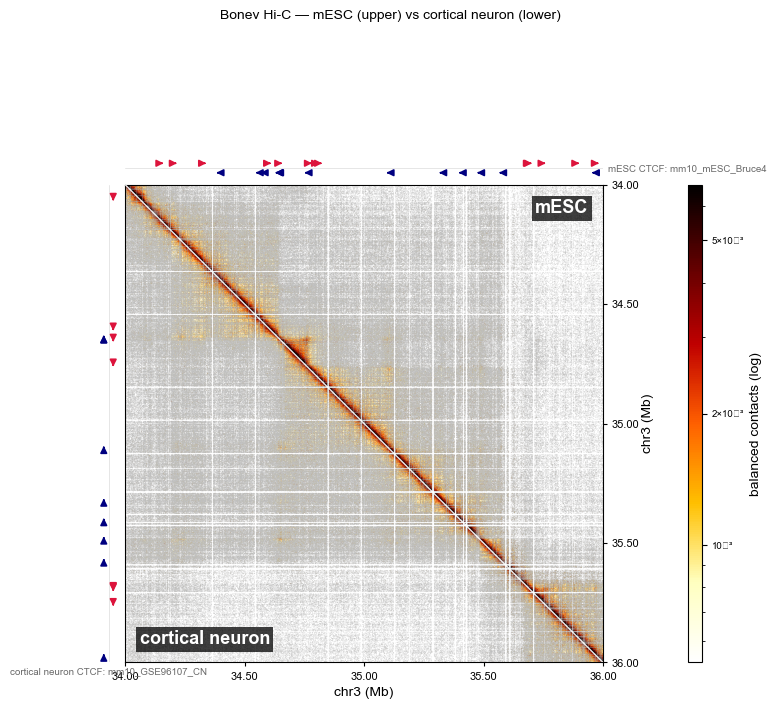

  saved: plot_hic_dual_ES_vs_CN.png + .svg


In [129]:
# >>> plot_hic + MSD overlay cells (auto-inserted) >>>
import sys
import os

# 1) Locate the 3D_genome_plotting checkout.  Search a few likely places
#    so the notebook is portable across machines / clones.
_PLOT_HIC_CANDIDATES = [
    os.environ.get("PLOT_HIC_REPO"),
    r"C:/Users/gabriele.michele/Documents/Claude/Projects/3D_genome_plotting",
    str(REPO_ROOT.parent / "3D_genome_plotting"),
    str(REPO_ROOT.parent.parent / "3D_genome_plotting"),
]
PLOT_HIC_DIR: Path | None = None
for cand in _PLOT_HIC_CANDIDATES:
    if not cand:
        continue
    p = Path(cand).expanduser()
    if (p / "plot_hic.py").exists():
        PLOT_HIC_DIR = p
        break
if PLOT_HIC_DIR is None:
    raise RuntimeError(
        "Could not find 3D_genome_plotting/plot_hic.py.  Set the "
        "PLOT_HIC_REPO env var to your local checkout, or place it next "
        "to cohesin_sim/."
    )
if str(PLOT_HIC_DIR) not in sys.path:
    sys.path.insert(0, str(PLOT_HIC_DIR))
print(f"plot_hic source : {PLOT_HIC_DIR}")

from plot_hic import plot_hic_dual, Region  # noqa: E402

REGION = Region(CHROM, REGION_START_BP, REGION_END_BP, RESOLUTION_BP)


# Color scale: tune `HIC_VMIN_PCT` / `HIC_VMAX_PCT` / `HIC_VMIN` /
# `HIC_VMAX` in CELL 1.  When `HIC_VMIN` / `HIC_VMAX` are None the cell
# auto-derives vmin/vmax from the positive entries of the combined
# (mESC+CN) matrix at the percentile bounds; set them to absolute numbers
# to override per-endpoint.  Both the auto-derived defaults AND the
# values actually used are printed below.


# 2) Single mESC (upper) vs CN (lower) split-triangle Hi-C map.
#    Requires BOTH Bonev references to have loaded into `maps` above.
if {"Hi-C_mESC", "Hi-C_neuron"} <= set(maps):
    # Compute the percentile-derived defaults explicitly so we (a) print
    # them next to the values actually used, and (b) feed plot_hic_dual
    # absolute numbers — `vmin=...`/`vmax=...` — instead of letting it
    # auto-derive its own.  Same percentile basis (positive entries of
    # the combined upper+lower matrix) as plot_hic_dual's _auto_limits.
    _combined_pos = np.concatenate([
        maps["Hi-C_mESC"][maps["Hi-C_mESC"] > 0].ravel(),
        maps["Hi-C_neuron"][maps["Hi-C_neuron"] > 0].ravel(),
    ])
    _default_vmin = float(np.percentile(_combined_pos, HIC_VMIN_PCT))
    _default_vmax = float(np.percentile(_combined_pos, HIC_VMAX_PCT))
    _vmin = _default_vmin if HIC_VMIN is None else float(HIC_VMIN)
    _vmax = _default_vmax if HIC_VMAX is None else float(HIC_VMAX)
    print(f"  HIC scale defaults (pct {HIC_VMIN_PCT}, {HIC_VMAX_PCT}) "
          f"-> vmin={_default_vmin:.3e}, vmax={_default_vmax:.3e}")
    print(f"  HIC scale used     "
          f"-> vmin={_vmin:.3e} ({'manual' if HIC_VMIN is not None else 'default'}), "
          f"vmax={_vmax:.3e} ({'manual' if HIC_VMAX is not None else 'default'})")

    out_path = FIGURES_DIR / "plot_hic_dual_ES_vs_CN"
    fig, _ = plot_hic_dual(
        maps["Hi-C_mESC"], maps["Hi-C_neuron"], REGION,
        top_label="mESC", left_label="cortical neuron",
        cmap="fall", norm="log",
        vmin=_vmin, vmax=_vmax,    # explicit — see prints above
        ctcf_bed_top =str(CTCF_BEDS["mESC"])
            if CTCF_BEDS.get("mESC")   and CTCF_BEDS["mESC"].exists()   else None,
        ctcf_bed_left=str(CTCF_BEDS["neuron"])
            if CTCF_BEDS.get("neuron") and CTCF_BEDS["neuron"].exists() else None,
        show_genes=False,         # offline-safe (UCSC fetch may not be reachable)
        title="Bonev Hi-C \u2014 mESC (upper) vs cortical neuron (lower)",
        out_path=str(out_path),
        save=Save_plots, save_format="both", dpi=200,
    )
    plt.show()
    if Save_plots:
        print(f"  saved: {out_path.name}.png + .svg")
    else:
        print(f"  rendered (Save_plots=False, not saved)")
else:
    missing = {"Hi-C_mESC", "Hi-C_neuron"} - set(maps)
    print(f"  [skip] mESC-vs-CN dual: missing {sorted(missing)} in `maps` "
          f"(check that data/mcool/{{ES,CN}}_chr3.mcool both loaded above)")

## mESC sim vs CN sim — CTCF tracks with MSD anchors highlighted

Single split-triangle simulated contact map: **mESC sim** in the upper triangle, **CN sim** in the lower triangle, separated by the white diagonal `plot_hic_dual` draws. The two cell-type oriented CTCF BEDs annotate their respective triangles (mESC BED on the top side, neuron BED on the left side, regular `+` crimson / `−` navy arrows). The **MSD-anchor subset** — the same probe sites that two-point MSD analysis selects — is overlaid in a distinct color on **both** CTCF strips.

The MSD anchors are looked up live by importing [`configs/parameters.py`](../configs/parameters.py) and calling `get_msd_pairs(cell_type)` — i.e. the *same* selector the simulation pipeline uses (conserved-between-cell-types convergent CTCF pairs flanking Sox2 by default, see `MSD_PROBE['auto']` in `parameters.py`). At 1 kb / monomer the returned monomer indices map 1-to-1 onto the contact map's bin coordinates. Saving is gated on `Save_plots`; the contrast knob is `SIM_DUAL_SCALE` in cell 1.

Edit `MSD_OVERLAY` below to pick a different mESC / CN condition or a different highlight color.

**Contact probability P(s).** The probability that two monomers separated
by genomic distance `s` are in physical contact, decaying approximately
as a power law `P(s) ~ s^(-β)` over a chosen distance window. β here is
an *empirical scaling exponent*, not a clean polymer-state label —
chromatin can show different β at short, mid, and long range
simultaneously. Reference values:

- β ≈ 1.5 — equilibrium globule (Lieberman-Aiden 2009 baseline; predicted,
  rarely observed in vivo).
- β ≈ 1.0 — fractal / crumpled globule (Grosberg 1988; Mirny 2011). The
  canonical short-range value; measured at β ≈ 1.08 in the first Hi-C
  paper (Lieberman-Aiden 2009).
- β ≈ 1.0–1.3 — typical in vivo mammalian, 10 kb–1 Mb scale
  (Bonev et al. 2017).
- Shallower β at intermediate scales — strong loop extrusion. Gassler 2017
  (Wapl-KO "vermicelli") and other extrusion-dominated contexts report
  β as low as ~0.7–0.9 at extruded scales. This is a regime-specific
  scaling, not a textbook polymer-state name.

> ⚠️ The MSD analysis section uses α for the sub-diffusion exponent in
> MSD(τ) ~ τ^α — that α IS a clean polymer-state label (0.5 = Rouse,
> 0.25–0.4 = loop-trapped). The two exponents have overlapping numerical
> ranges but different physical meanings; we use β here and α in the MSD
> section to keep them distinct.

Mirny-style piecewise fits (Gassler 2017; Polovnikov et al. 2023) separate
the short-range non-scaling regime (s < ~2 kb) from the scaling regime
(~2–30 kb at our 1 kb-per-bin resolution) where β is read off the linear
log-log slope.

**References for this section.**
- Lieberman-Aiden et al. (2009) *Science* 326:289-293 — first Hi-C, β ≈ 1.08.
- Mirny LA (2011) *Chromosome Res* 19:37-51 — fractal-globule review.
- Bonev B et al. (2017) *Cell* 171:557-572 — mESC vs neuron Hi-C, this project's reference data.
- Gassler J et al. (2017) *EMBO J* 36:3600-3618 — Wapl-KO P(s) shifts; piecewise fitting convention.
- Polovnikov KE et al. (2023) — theoretical regimes of P(s).
- Grosberg, Nechaev, Shakhnovich (1988) J. Phys. — theoretical proposal.


**Two-point MSD α reference values (use these in the theory cell):**

| α | physical interpretation | reference |
|---|---|---|
| 1.0 | free diffusion | textbook |
| ≈ 0.5 | classical Rouse polymer (theoretical baseline; rarely seen in cells) | Rouse 1953 |
| ≈ 0.4 | fractal-globule prediction | Tamm 2015 |
| **≈ 0.3** | **strongly subdiffusive in vivo** — current best estimate from MINFLUX, mouse + human, robust across 7 orders of magnitude in time. **Rises** when cohesin/loop extrusion is acutely depleted (RAD21-AID). | **Mazzocca, Narducci, Grosse-Holz, Matthias, Hansen 2025 bioRxiv 2025.05.10.653248** |
| ≈ 0.5 (older SPT estimates) | over-estimated due to insufficient time resolution / motion blur | Gabriele 2022, Mach 2022 — superseded by MINFLUX |
| ≈ 0.1–0.25 (plateau) | loop-trapped pair, MSD saturates at 2J (J = loop end-to-end variance) | this notebook's section 5 |

> ⚠️ Direction of the loop-extrusion effect (counterintuitive at first
> reading): Mazzocca 2025 finds α *increases* under cohesin loss, meaning
> the loop-extrusion machinery *constrains* dynamics in WT cells. So in
> our sweeps, the high-cohesin / long-residence neuron parameters
> should produce **LOWER α** than the mESC control — i.e., MORE
> sub-diffusive — opposite to what one might naively guess from "more
> diffusion-like in compact fractal-globule" reasoning. Our prior on
> the neuron sweep should be α(neuron) < α(mESC), with the magnitude
> of the gap reporting the strength of the cohesin-mediated constraint.

### The unified scale-free framework — Grosse-Holz, Mirny & Coulon 2025

A useful way to read the rest of this notebook is through the lens of
**Grosse-Holz, Mirny & Coulon (2025)** *"Scale-free models of chromosome
structure, dynamics, and mechanics"*, **PNAS Nexus 4(12):pgaf337**,
doi:10.1093/pnasnexus/pgaf337 (PMC12706471). They argue that the three
classes of observables we look at downstream — P(s) from contact maps,
MSD from two-point tracking, and (separately) the force response of a
single locus — are not independent: a self-consistent scale-free
description of chromatin requires their scaling exponents to satisfy
two algebraic relations. The same paper points out that **no single
classical polymer model (Rouse, Zimm, fractal globule) simultaneously
matches all observed metazoan exponents**.

The exponents (their notation, recommended for cross-paper consistency):

| symbol | observable | metazoan in vivo (current best) | toy-model values |
|---|---|---|---|
| **ν** | spatial separation: `R(s) ~ s^ν` | ≈ 0.33 (space-filling) | Rouse 1/2 · fractal globule 1/3 |
| **β = 3ν** | contact probability: `P(s) ~ s^(-β)` | ≈ 1.0 (β = 3·0.33) | Rouse 3/2 · fractal globule 1 |
| **α** (Grosse-Holz μ) | single-locus MSD: `MSD(τ) ~ τ^α` | **≈ 0.3** (Mazzocca 2025 MINFLUX, was thought to be 0.5–0.6 from SPT) | Rouse 1/2 · fractal globule 2/5 · Zimm 2/3 |
| **α_solv** (Grosse-Holz α) | nucleoplasm viscoelasticity (free tracer) | ≈ 0.5–1 (poorly constrained) | viscous fluid 1 |
| **δ** | finite-coil hydrodynamic radius scaling | unmeasured | freely draining 1 · Zimm ν |
| **ρ, ψ** | force-response exponents | ρ ≈ 0.5, ψ ≈ 1 (Mach 2024) | Rouse ρ = 1/2, ψ = 1 |

The two consistency relations from the paper (Eq. 7):

1. **Structure ↔ dynamics:** the triplet (ν, μ, α, δ) is over-determined.
   The "best" metazoan estimate ν ≈ 0.33, μ ≈ 0.5 is **inconsistent with
   Rouse** (which has ν = μ = 1/2) and **inconsistent with the fractal
   globule** (which has ν = 1/3 but predicts μ = 2/5). The deviation has
   to be absorbed by either a viscoelastic nucleoplasm (α ≠ 1) or
   intermediate hydrodynamic correlations (ν < δ < 1).
2. **Dynamics ↔ mechanics:** ρ·ψ = μ. With the experimentally measured
   ψ ≈ 1, ρ = μ — so the force-response and MSD exponents must agree.
   Mach et al. 2024 measured ρ ≈ 0.5, μ ≈ 0.5 in the same system, which
   is one of the few existing cross-checks of this relation.

**What this means for our simulation comparisons.** Looking at any one
of P(s) / MSD / AbLE in isolation, the polymer-state interpretation is
ambiguous — the same numerical exponent is consistent with many physical
scenarios. Looking at *all three together* on the same condition, with
the consistency relations as a sanity check, is where the framework
earns its keep. If our neuron-parameter sweeps produce e.g. β shifting
from 1.0 → 0.85 (more loop-extruded) but μ stays at 0.5, that combination
is *not* a textbook polymer state — it points (per Grosse-Holz 2025)
either at an active scale-dependent process (loop extrusion itself) or
at intermediate hydrodynamic correlations not captured by the freely
draining Rouse picture. The notebook's cross-condition summary table
(section 7) is the right place to inspect these triples side by side.

> Note: Grosse-Holz is also a co-author on the Jusuf et al. 2025 AbLE
> preprint (PMC11812599) that defines the loop-strength method we use
> in section 4. Same lab cluster (Mirny + Giorgetti + Hansen).

**Reference.** Grosse-Holz S, Mirny LA, Coulon A (2025) "Scale-free models
of chromosome structure, dynamics, and mechanics", **PNAS Nexus
4(12):pgaf337**, doi:10.1093/pnasnexus/pgaf337. Open access (gold).

  MSD anchors (mESC)  : 4 sites at bins [601, 647, 1103, 1323]
  MSD anchors (neuron): 4 sites at bins [601, 647, 1103, 1323]


C:\Users\gabriele.michele\AppData\Local\Temp\ipykernel_48288\2356128386.py:190: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.savefig(f"{out_stem}.png", dpi=200, bbox_inches="tight")
C:\Users\gabriele.michele\AppData\Local\Temp\ipykernel_48288\2356128386.py:191: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.savefig(f"{out_stem}.svg",            bbox_inches="tight")
C:\Users\gabriele.michele\AppData\Local\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


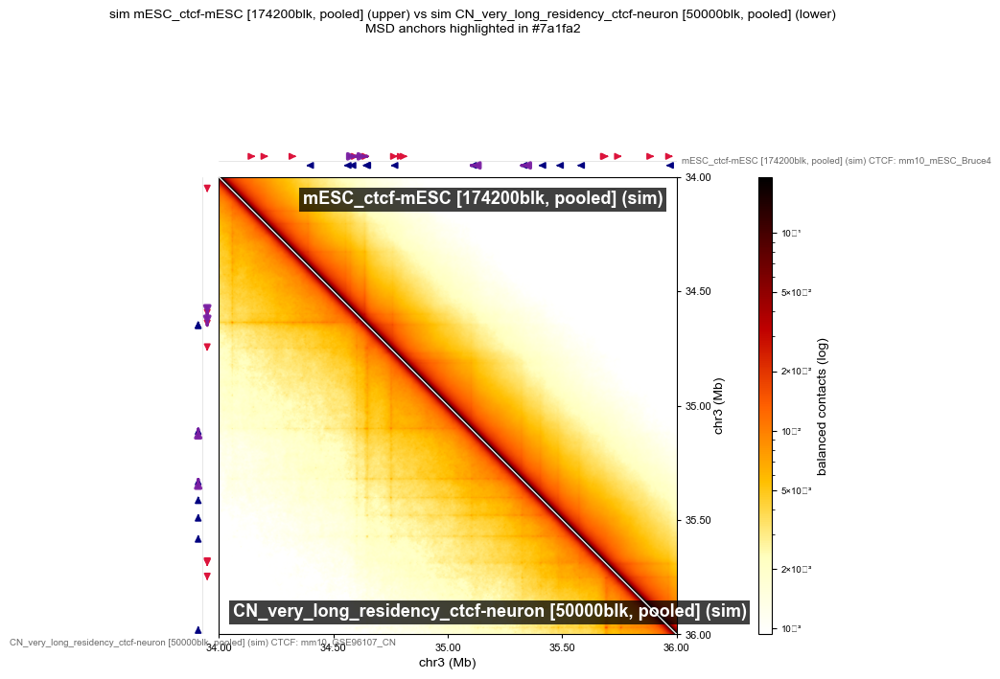

  saved: plot_hic_dual_mESC_ctcf-mESC_vs_CN_very_long_residency_ctcf-neuron_with_msd.png + .svg (MSD anchors top=4, left=4)


In [130]:
# Pick the two simulated conditions to compare here.  Both stems must
# be present in CONDITIONS / maps (the CTCF source token after `_ctcf-`
# determines which BED the regular arrows come from).
MSD_OVERLAY = dict(
    sim_mesc        = "mESC_ctcf-mESC",                          # mESC sim panel (upper triangle)
    sim_cn          = "CN_very_long_residency_ctcf-neuron",      # CN  sim panel (lower triangle)
    overlay_color   = "#7a1fa2",   # purple-magenta — distinct from + crimson / - navy
    overlay_lw      = 2.4,
    overlay_arrow_bp = 24_000,     # slightly wider than plot_hic's default 20 kb
)

# Color scale: tune `SIM_DUAL_SCALE` in CELL 1 (same shape as cell 12 —
# percentile bounds on the combined matrix, optional absolute overrides).

# 1) Import configs/parameters.py from the cohesin_sim project root so we
#    can call the same MSD selector the simulation pipeline uses.
import importlib.util
import pandas as pd

_PARAMS_PY = REPO_ROOT / "configs" / "parameters.py"
_spec = importlib.util.spec_from_file_location("cohesin_sim_parameters", _PARAMS_PY)
params = importlib.util.module_from_spec(_spec)
_spec.loader.exec_module(params)   # type: ignore[union-attr]

# Sanity: REGION_START / RESOLUTION must agree with this notebook's region.
assert params.REGION_START == REGION_START_BP, (
    f"REGION_START mismatch: parameters.py={params.REGION_START} "
    f"vs notebook={REGION_START_BP}")
assert params.RESOLUTION == RESOLUTION_BP, (
    f"RESOLUTION mismatch: parameters.py={params.RESOLUTION} "
    f"vs notebook={RESOLUTION_BP}")


def msd_anchor_dataframe(cell_type: str) -> pd.DataFrame:
    """Return a DataFrame with the same columns plot_hic.load_ctcf_bed
    produces (chrom / start / end / strand / center_bin), restricted to
    the MSD-anchor subset for `cell_type`."""
    pairs, _labels = params.get_msd_pairs(cell_type)
    pos, ori = params.get_ctcf_arrays(cell_type)
    pos_to_ori = dict(zip(pos.tolist(), ori.tolist()))

    anchors = sorted({a for pair in pairs for a in pair})
    rows = []
    for monomer in anchors:
        ori_int = pos_to_ori.get(monomer)
        # The auto-selector may relax conservation/convergence; if so the
        # picked anchor may not be in this cell type's own BED.  Skip
        # those silently rather than mislabel their orientation.
        if ori_int is None:
            continue
        bp_mid = REGION_START_BP + monomer * RESOLUTION_BP
        rows.append({
            "chrom":      CHROM,
            "start":      bp_mid - RESOLUTION_BP // 2,
            "end":        bp_mid + RESOLUTION_BP // 2,
            "name":       f"msd_anchor_{monomer}",
            "score":      0,
            "strand":     "+" if ori_int == +1 else "-",
            "center_bin": float(monomer),
        })
    df = pd.DataFrame(rows, columns=[
        "chrom", "start", "end", "name", "score", "strand", "center_bin",
    ])
    return df


def overlay_msd_anchors(ax, anchors_df: pd.DataFrame, region_obj,
                        orientation: str,
                        color: str, arrow_bp: int, lw: float) -> None:
    """Re-implements plot_hic.draw_ctcf_strip's arrow logic for the MSD
    subset only, with a distinct color and a slightly heavier line so the
    highlighted anchors stand out on top of the regular strip.

    `orientation` is "top" (horizontal arrows on the top CTCF strip) or
    "left" (vertical arrows on the left CTCF strip), matching plot_hic's
    own convention.
    """
    arrow_bins = arrow_bp / region_obj.bin_size
    for _, row in anchors_df.iterrows():
        c = row["center_bin"]
        is_plus = row["strand"] == "+"
        level = 0.72 if is_plus else 0.28      # same lanes as draw_ctcf_strip
        if orientation == "top":
            x0, x1 = ((c - arrow_bins / 2, c + arrow_bins / 2) if is_plus
                      else (c + arrow_bins / 2, c - arrow_bins / 2))
            ax.annotate("", xy=(x1, level), xytext=(x0, level),
                        arrowprops=dict(arrowstyle="-|>", color=color,
                                        lw=lw, alpha=0.95))
        elif orientation == "left":
            y0, y1 = ((c - arrow_bins / 2, c + arrow_bins / 2) if is_plus
                      else (c + arrow_bins / 2, c - arrow_bins / 2))
            ax.annotate("", xy=(level, y1), xytext=(level, y0),
                        arrowprops=dict(arrowstyle="-|>", color=color,
                                        lw=lw, alpha=0.95))
        else:
            raise ValueError(f"orientation must be 'top' or 'left', got {orientation!r}")


# Compact provenance label for sim conditions — every figure label that
# names a sim map MUST surface block + replicate count (project rule).
def _short_sim_label(name: str) -> str:
    if name in MCOOL_REFS:
        return name
    label = labels.get(name, "")
    m = re.search(r"_(\d+)blk_pooled_contact_map\.npy", label)
    if m:
        return f"{name} [{m.group(1)}blk, pooled]"
    m_reps = re.search(r"mean of (\d+) reps", label)
    if m_reps:
        rep_paths = sorted(glob.glob(
            str(ANALYSIS_DIR / f"{name}_*blk_rep*_contact_map.npy")
        ))
        if rep_paths:
            m_blk = re.search(r"_(\d+)blk_rep", Path(rep_paths[0]).name)
            if m_blk:
                return (f"{name} [{m_blk.group(1)}blk, "
                        f"mean of {m_reps.group(1)} reps]")
        return f"{name} [mean of {m_reps.group(1)} reps]"
    return name


# 2) Render mESC sim (upper triangle) and CN sim (lower triangle) on the
#    SAME heatmap via plot_hic_dual, separated by the white diagonal.
#    Each triangle gets its own oriented CTCF strip (mESC BED on the top
#    side, neuron BED on the left side); the MSD anchor subset is
#    overlaid on BOTH strips in `overlay_color`.
sim_mesc = MSD_OVERLAY["sim_mesc"]
sim_cn   = MSD_OVERLAY["sim_cn"]

mesc_anchors_df   = msd_anchor_dataframe("mESC")
neuron_anchors_df = msd_anchor_dataframe("neuron")
print(f"  MSD anchors (mESC)  : {len(mesc_anchors_df)} sites at bins "
      f"{sorted(mesc_anchors_df['center_bin'].astype(int).tolist())}")
print(f"  MSD anchors (neuron): {len(neuron_anchors_df)} sites at bins "
      f"{sorted(neuron_anchors_df['center_bin'].astype(int).tolist())}")

if sim_mesc not in maps or sim_cn not in maps:
    missing = [c for c in (sim_mesc, sim_cn) if c not in maps]
    print(f"  [skip] mESC-sim vs CN-sim dual: missing {missing} in `maps`. "
          f"Add to CONDITIONS in cell 1 and re-run cell 3, or change "
          f"MSD_OVERLAY['sim_mesc'] / ['sim_cn'] above.")
else:
    bed_mesc   = CTCF_BEDS.get("mESC")
    bed_neuron = CTCF_BEDS.get("neuron")
    out_stem = FIGURES_DIR / f"plot_hic_dual_{sim_mesc}_vs_{sim_cn}_with_msd"

    # Compact provenance labels include block + replicate count so the
    # figure tells you at a glance how much sim time backs each panel.
    label_mesc = _short_sim_label(sim_mesc)
    label_cn   = _short_sim_label(sim_cn)

    # save=False so we can paint the MSD overlay onto each CTCF strip
    # *before* the figure is committed to disk.
    fig, axes = plot_hic_dual(
        maps[sim_mesc], maps[sim_cn], REGION,
        top_label=f"{label_mesc} (sim)",
        left_label=f"{label_cn} (sim)",
        cmap="fall", norm="log",
        vmin_pct=SIM_DUAL_SCALE["vmin_pct"],
        vmax_pct=SIM_DUAL_SCALE["vmax_pct"],
        vmin    =SIM_DUAL_SCALE["vmin"],
        vmax    =SIM_DUAL_SCALE["vmax"],
        ctcf_bed_top =str(bed_mesc)   if bed_mesc   and bed_mesc.exists()   else None,
        ctcf_bed_left=str(bed_neuron) if bed_neuron and bed_neuron.exists() else None,
        show_genes=False,
        title=(f"sim {label_mesc} (upper) vs sim {label_cn} (lower)\n"
               f"MSD anchors highlighted in {MSD_OVERLAY['overlay_color']}"),
        out_path=str(out_stem),
        save=False,                     # write manually after overlay
    )

    if "ctcf_top" in axes and not mesc_anchors_df.empty:
        overlay_msd_anchors(
            axes["ctcf_top"], mesc_anchors_df, REGION,
            orientation="top",
            color=MSD_OVERLAY["overlay_color"],
            arrow_bp=MSD_OVERLAY["overlay_arrow_bp"],
            lw=MSD_OVERLAY["overlay_lw"],
        )
    if "ctcf_left" in axes and not neuron_anchors_df.empty:
        overlay_msd_anchors(
            axes["ctcf_left"], neuron_anchors_df, REGION,
            orientation="left",
            color=MSD_OVERLAY["overlay_color"],
            arrow_bp=MSD_OVERLAY["overlay_arrow_bp"],
            lw=MSD_OVERLAY["overlay_lw"],
        )

    if Save_plots:
        fig.savefig(f"{out_stem}.png", dpi=200, bbox_inches="tight")
        fig.savefig(f"{out_stem}.svg",            bbox_inches="tight")
    plt.show()
    if Save_plots:
        print(f"  saved: {out_stem.name}.png + .svg "
              f"(MSD anchors top={len(mesc_anchors_df)}, left={len(neuron_anchors_df)})")
    else:
        print(f"  rendered (Save_plots=False, not saved): {out_stem.name} "
              f"(MSD anchors top={len(mesc_anchors_df)}, left={len(neuron_anchors_df)})")

## CN simulations vs Bonev cortical-neuron Hi-C — one panel per residency variant

Single split-triangle heatmap for **each** CN simulation in `CONDITIONS`:
the CN sim sits in the upper triangle, the experimental Bonev cortical-
neuron Hi-C (`Hi-C_neuron`) sits in the lower triangle, separated by a
white diagonal. Both triangles are annotated with the same neuron
oriented CTCF BED (top + left strips), since both panels target the
cortical-neuron CTCF landscape.

**Per-triangle log scales + per-triangle colorbars.** Balanced Hi-C
contact frequencies (~$10^{-4}$ to $10^{-2}$) and simulated contact
frequencies (~$10^{-3}$ to $10^{-1}$) live on different absolute scales
by 1–2 orders of magnitude. A shared color norm makes one triangle wash
out (this happens with `plot_hic_dual`, which builds a single combined
matrix and one shared `LogNorm`). This cell therefore builds the dual
heatmap **directly** with two masked `imshow` calls on one axes — sim
masked to the upper triangle, Hi-C masked to the lower — each with its
own `LogNorm` clipped per triangle. **Two colorbars are stacked
vertically on the right** (top one matches the sim triangle, bottom one
matches the Hi-C triangle) so each scale is independently readable.
Tune `SIM_VS_HIC_SCALE` in cell 1.

The sim panel label includes the **block count and (when known) the
replicate count** — e.g. `CN_long_residency_ctcf-neuron [78500blk,
mean of 3 reps]` — so the figure shows at a glance how much simulation
time backs the upper triangle.

Iterates over every `CN_*` stem present in `CONDITIONS`, so adding a
new residency variant to cell 1 propagates here automatically. Skips
with a one-line message if `Hi-C_neuron` failed to load above (e.g.
cooler not installed).

Outputs (gated on `Save_plots`): one `plot_hic_dual_<sim>_vs_Hi-C_neuron.{png,svg}` per CN condition under `FIGURES_DIR`.

    sim  range = [3.27e-04, 1.92e-01]
    Hi-C range = [2.21e-04, 6.33e-03]
  saved: plot_hic_dual_CN_baseline_ctcf-neuron_vs_Hi-C_neuron.png + .svg


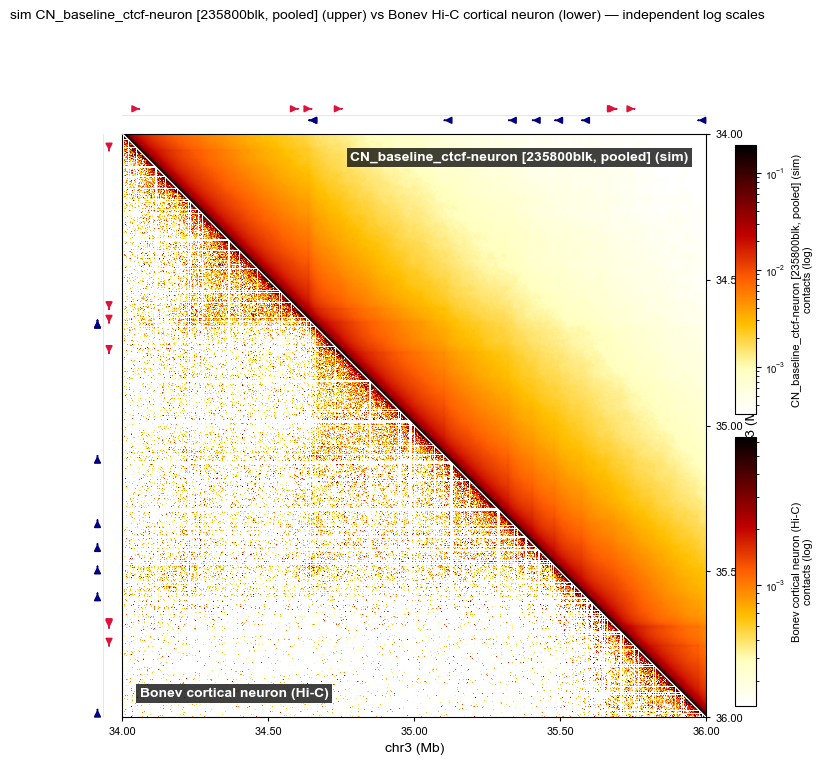

    sim  range = [3.25e-04, 1.86e-01]
    Hi-C range = [2.21e-04, 6.33e-03]
  saved: plot_hic_dual_CN_long_residency_ctcf-neuron_vs_Hi-C_neuron.png + .svg


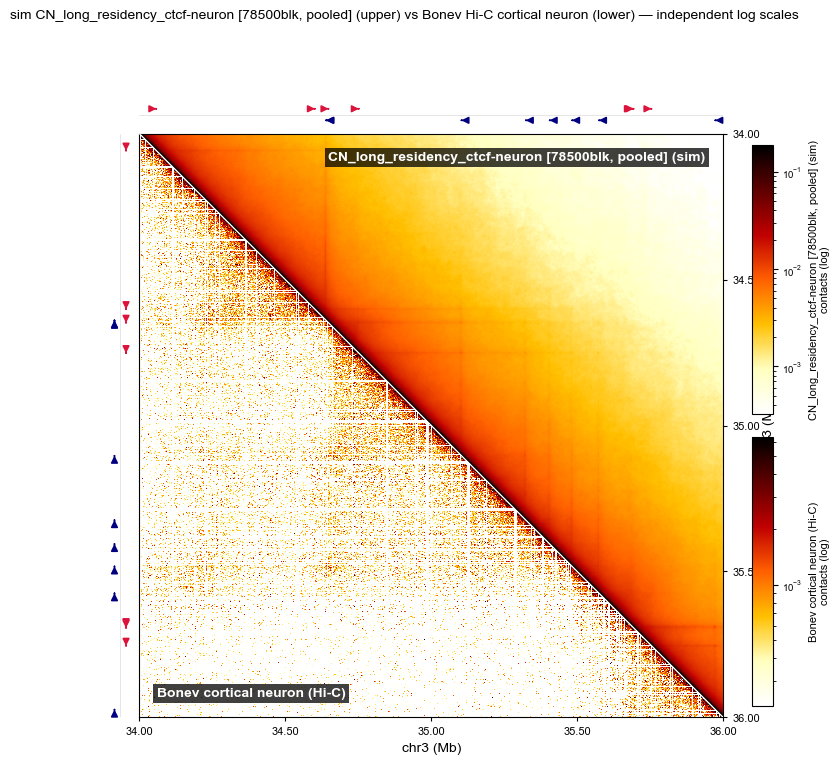

    sim  range = [5.67e-04, 1.83e-01]
    Hi-C range = [2.21e-04, 6.33e-03]
  saved: plot_hic_dual_CN_very_long_residency_ctcf-neuron_vs_Hi-C_neuron.png + .svg


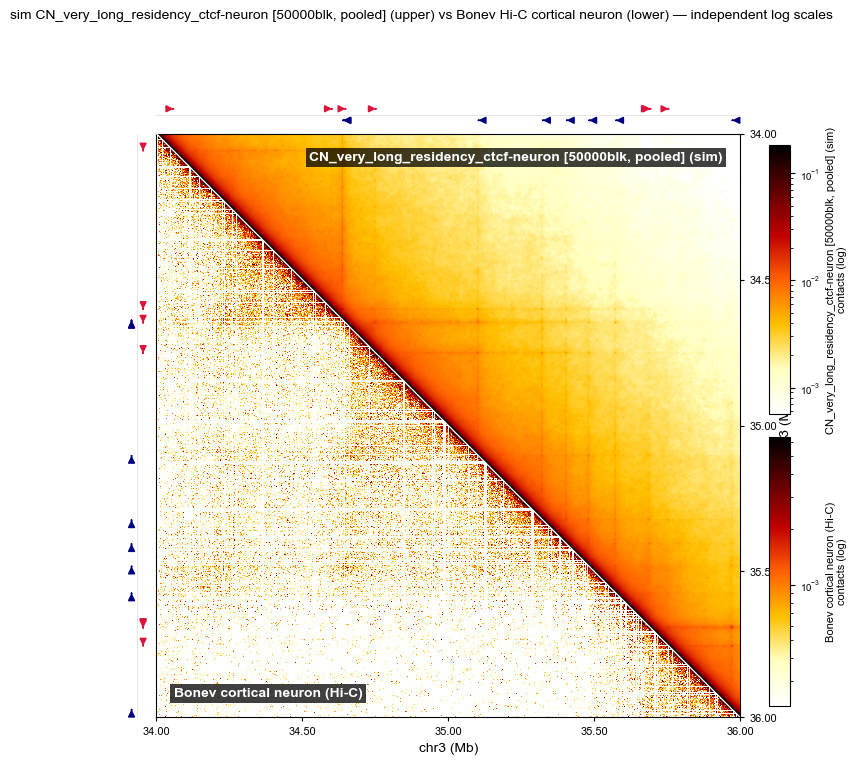

In [131]:
# CN sims vs Bonev cortical-neuron Hi-C, one split-triangle per CN sim.
# INDEPENDENT log color scales per triangle + INDEPENDENT colorbars
# stacked vertically on the right (sim on top, Hi-C on bottom).  A
# shared norm washes Hi-C out (Hi-C ~ 1e-4..1e-2, sim ~ 1e-3..1e-1).
#
# We don't use plot_hic_dual here because plot_hic_dual builds a single
# combined matrix and a single imshow with one shared norm (see
# 3D_genome_plotting/plot_hic.py around line 1227).  Instead we render
# the dual triangle directly with two masked imshows + the same CTCF /
# Mb-tick / corner-badge styling as plot_hic_dual.

import numpy as np
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Pull the small set of styling helpers out of plot_hic so this cell
# stays visually consistent with cells 12 and 14.  These imports rely
# on cell 12 having already added 3D_genome_plotting/ to sys.path.
from plot_hic import (
    FALL_CMAP,
    draw_ctcf_strip,
    load_ctcf_bed,
    set_mb_ticks,
)


# Cell 16 — CN sim vs Hi-C neuron, INDEPENDENT log scales per triangle.
SIM_VS_HIC_SCALE = dict(
    # sim_vmin_pct=20.0, sim_vmax_pct=99.5,
    hic_vmin_pct=10.0, hic_vmax_pct=99.5,
    sim_vmin_pct=1.0, sim_vmax_pct=99.5,
    sim_vmin=None,     sim_vmax=None,    # absolute overrides per triangle
    hic_vmin=None,     hic_vmax=None,
)


# Compact provenance label for sim conditions — every figure label that
# names a sim map MUST surface block + replicate count (project rule).
def _short_sim_label(name: str) -> str:
    if name in MCOOL_REFS:
        return name
    label = labels.get(name, "")
    m = re.search(r"_(\d+)blk_pooled_contact_map\.npy", label)
    if m:
        return f"{name} [{m.group(1)}blk, pooled]"
    m_reps = re.search(r"mean of (\d+) reps", label)
    if m_reps:
        rep_paths = sorted(glob.glob(
            str(ANALYSIS_DIR / f"{name}_*blk_rep*_contact_map.npy")
        ))
        if rep_paths:
            m_blk = re.search(r"_(\d+)blk_rep", Path(rep_paths[0]).name)
            if m_blk:
                return (f"{name} [{m_blk.group(1)}blk, "
                        f"mean of {m_reps.group(1)} reps]")
        return f"{name} [mean of {m_reps.group(1)} reps]"
    return name


# Color scale: tune `SIM_VS_HIC_SCALE` in CELL 1.  Each triangle has its
# own LogNorm — the dict has `sim_*` and `hic_*` slots for separate
# percentile bounds and absolute overrides.  Splatted in below via
# `**SIM_VS_HIC_SCALE`.


def _percentile_log_lim(m: np.ndarray, lo_pct: float = 20.0,
                        hi_pct: float = 99.5) -> tuple[float, float]:
    """Per-matrix vmin/vmax for a LogNorm, computed on positive values."""
    pos = m[m > 0]
    if pos.size == 0:
        return 1e-12, 1.0
    v_lo = float(np.percentile(pos, lo_pct))
    v_hi = float(np.percentile(pos, hi_pct))
    if v_lo <= 0:
        v_lo = max(float(pos.min()), 1e-12)
    if v_hi <= v_lo:
        v_hi = v_lo * 10
    return v_lo, v_hi


def _plot_dual_per_scale(sim_map: np.ndarray, hic_map: np.ndarray, region,
                         *, sim_label: str, hic_label: str,
                         ctcf_bed_path: str | None,
                         out_stem: Path, title: str | None = None,
                         dpi: int = 200,
                         save_plots: bool = True,
                         sim_vmin_pct: float = 20.0, sim_vmax_pct: float = 99.5,
                         hic_vmin_pct: float = 20.0, hic_vmax_pct: float = 99.5,
                         sim_vmin: float | None = None,
                         sim_vmax: float | None = None,
                         hic_vmin: float | None = None,
                         hic_vmax: float | None = None) -> None:
    """Split-triangle heatmap with INDEPENDENT log norms + INDEPENDENT
    colorbars per triangle.

    Layout:
        - one square heatmap axes with two masked imshow calls
          (sim → upper triangle, Hi-C → lower triangle)
        - two CTCF strips appended to the top + left sides
        - TWO colorbars stacked vertically to the right of the heatmap,
          placed via `inset_axes` against `ax_main.transAxes` so the
          placement is robust regardless of figure size or other strips.
          Upper cbar matches the sim (upper) triangle, lower cbar
          matches the Hi-C (lower) triangle — the spatial association
          makes the figure self-explanatory.
    """
    if sim_map.shape != hic_map.shape or sim_map.shape[0] != sim_map.shape[1]:
        raise ValueError(f"matrices must be square + same shape, got "
                         f"{sim_map.shape} vs {hic_map.shape}")
    n = sim_map.shape[0]

    # Resolve color limits: explicit absolute overrides win over the
    # percentile-derived defaults.  Each triangle is independent.
    auto_sim_vmin, auto_sim_vmax = _percentile_log_lim(sim_map, sim_vmin_pct, sim_vmax_pct)
    auto_hic_vmin, auto_hic_vmax = _percentile_log_lim(hic_map, hic_vmin_pct, hic_vmax_pct)
    sim_vmin = auto_sim_vmin if sim_vmin is None else float(sim_vmin)
    sim_vmax = auto_sim_vmax if sim_vmax is None else float(sim_vmax)
    hic_vmin = auto_hic_vmin if hic_vmin is None else float(hic_vmin)
    hic_vmax = auto_hic_vmax if hic_vmax is None else float(hic_vmax)
    print(f"    sim  range = [{sim_vmin:.2e}, {sim_vmax:.2e}]")
    print(f"    Hi-C range = [{hic_vmin:.2e}, {hic_vmax:.2e}]")

    # Mask each matrix to its own triangle so the two imshows don't
    # paint over each other.  Diagonal stays masked in BOTH (the white
    # diagonal line is drawn over it).
    upper_mask = np.tri(n, n, k=0,  dtype=bool)   # mask lower + diag
    lower_mask = ~np.tri(n, n, k=-1, dtype=bool)  # mask upper + diag
    sim_view = np.ma.masked_array(sim_map, mask=upper_mask)
    hic_view = np.ma.masked_array(hic_map, mask=lower_mask)

    # Roomier figure so the two stacked colorbars + their labels fit.
    fig = plt.figure(figsize=(8.6, 8.0))
    ax_main = fig.add_subplot(111)
    extent = (0, n, n, 0)

    im_upper = ax_main.imshow(
        sim_view, cmap=FALL_CMAP,
        norm=LogNorm(vmin=sim_vmin, vmax=sim_vmax),
        origin="upper", aspect="equal", extent=extent,
        interpolation="nearest",
    )
    im_lower = ax_main.imshow(
        hic_view, cmap=FALL_CMAP,
        norm=LogNorm(vmin=hic_vmin, vmax=hic_vmax),
        origin="upper", aspect="equal", extent=extent,
        interpolation="nearest",
    )
    ax_main.plot([0, n], [0, n], color="white", lw=1.0, alpha=0.9, zorder=5)

    divider = make_axes_locatable(ax_main)

    # Per-triangle CTCF strips: top annotates the sim triangle, left
    # annotates the Hi-C triangle.  Both read the same neuron BED
    # because both panels target the cortical-neuron CTCF landscape.
    if ctcf_bed_path:
        ctcf_df = load_ctcf_bed(ctcf_bed_path, region)
        ax_top = divider.append_axes("top",  size="4.5%", pad=0.06, sharex=ax_main)
        draw_ctcf_strip(ax_top, ctcf_df, "top",  region, arrow_bp=20_000)
        ax_lft = divider.append_axes("left", size="4.5%", pad=0.06, sharey=ax_main)
        draw_ctcf_strip(ax_lft, ctcf_df, "left", region, arrow_bp=20_000)
        for sub in (ax_top, ax_lft):
            sub.set_xticks([]); sub.set_yticks([])
            sub.tick_params(left=False, bottom=False,
                            labelleft=False, labelbottom=False)

    # Two colorbars STACKED VERTICALLY to the right of the heatmap.
    # `inset_axes` with `bbox_to_anchor=...` and `bbox_transform=ax_main.transAxes`
    # keeps the placement axes-relative — independent of figure size,
    # CTCF strip widths, or future layout changes.
    cax_upper = inset_axes(
        ax_main, width="100%", height="100%",
        bbox_to_anchor=(1.05, 0.52, 0.035, 0.46),
        bbox_transform=ax_main.transAxes, borderpad=0, loc="lower left",
    )
    cax_lower = inset_axes(
        ax_main, width="100%", height="100%",
        bbox_to_anchor=(1.05, 0.02, 0.035, 0.46),
        bbox_transform=ax_main.transAxes, borderpad=0, loc="lower left",
    )
    cb_upper = fig.colorbar(im_upper, cax=cax_upper)
    cb_lower = fig.colorbar(im_lower, cax=cax_lower)
    cb_upper.set_label(f"{sim_label}\ncontacts (log)", fontsize=8)
    cb_lower.set_label(f"{hic_label}\ncontacts (log)", fontsize=8)
    cb_upper.ax.tick_params(labelsize=7)
    cb_lower.ax.tick_params(labelsize=7)

    # Corner badges identifying the two triangles (mirrors plot_hic_dual).
    bb = dict(facecolor="black", edgecolor="none", pad=2.5, alpha=0.75)
    ax_main.text(0.97, 0.97, sim_label, ha="right", va="top",
                 transform=ax_main.transAxes, fontsize=10,
                 fontweight="bold", color="white", bbox=bb)
    ax_main.text(0.03, 0.03, hic_label, ha="left", va="bottom",
                 transform=ax_main.transAxes, fontsize=10,
                 fontweight="bold", color="white", bbox=bb)

    set_mb_ticks(ax_main, region, y_right=True)
    if title is None:
        title = (f"{region.label()}, {region.bin_size/1000:g} kb \u2014 "
                 f"{sim_label} (upper) vs {hic_label} (lower) "
                 "\u2014 independent log scales")
    fig.suptitle(title, y=0.995, fontsize=10)

    if save_plots:
        fig.savefig(f"{out_stem}.png", dpi=dpi, bbox_inches="tight")
        fig.savefig(f"{out_stem}.svg",            bbox_inches="tight")
        print(f"  saved: {out_stem.name}.png + .svg")
    else:
        print(f"  rendered (Save_plots=False, not saved): {out_stem.name}")


if "Hi-C_neuron" not in maps:
    print("  [skip] Hi-C_neuron not loaded into `maps` (cooler missing or "
          "data/mcool/CN_chr3.mcool absent). Re-run cell 3 with cooler "
          "available to populate it.")
else:
    cn_sims = [c for c in CONDITIONS if c.startswith("CN_") and c in maps]
    if not cn_sims:
        print("  [skip] no CN_* simulated conditions found in `maps`.")
    else:
        bed_neuron = CTCF_BEDS.get("neuron")
        bed_neuron_str = (str(bed_neuron)
                          if bed_neuron and bed_neuron.exists() else None)

        for cn_sim in cn_sims:
            out_stem = FIGURES_DIR / f"plot_hic_dual_{cn_sim}_vs_Hi-C_neuron"
            sim_label = _short_sim_label(cn_sim)
            _plot_dual_per_scale(
                maps[cn_sim], maps["Hi-C_neuron"], REGION,
                sim_label=f"{sim_label} (sim)",
                hic_label="Bonev cortical neuron (Hi-C)",
                ctcf_bed_path=bed_neuron_str,
                out_stem=out_stem,
                title=(f"sim {sim_label} (upper) vs Bonev Hi-C cortical "
                       f"neuron (lower) \u2014 independent log scales"),
                save_plots=Save_plots,
                **SIM_VS_HIC_SCALE,
            )
            plt.show()